In [23]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

In [4]:
# load the results from one of the cross validation folds
pred_dir = "models_preds"
file_name = "UCLA_results_validation_cross_validation_datalen-40720_epochs-100_init_lr-0.01_momentum-0.9_batch_size-32_n_folds-5_n_folds_seed-300_split-0.csv"

preds = pd.read_csv(os.path.join(pred_dir, file_name))
        
print ("loaded ", len(preds), " rows")

loaded  8143  rows


In [20]:
preds

,imageHASH,name,violence,protest,sign,photo,fire,police,children,group_20,...,pred_photo,pred_fire,pred_police,pred_children,pred_group_20,pred_group_100,pred_flag,pred_night,pred_shouting,violence_ann_vs_pred
0,64adf672a10584f0,train-15308.jpg,0.415880,True,1,0,0,0,0,1,...,0.007363,0.175213,0.230780,0.003175,0.806174,0.080516,0.431952,0.044314,0.019730,0.148152
1,f829656d1b626745,train-02503.jpg,-1.000000,False,-1,-1,-1,-1,-1,-1,...,0.436281,0.000692,0.000851,0.012794,0.316510,0.057493,0.016921,0.032298,0.086450,1.209502
2,6b591513796f7731,train-28781.jpg,-1.000000,False,-1,-1,-1,-1,-1,-1,...,0.252951,0.000054,0.000099,0.082422,0.238783,0.028939,0.019382,0.000910,0.004693,1.129527
3,d71c3e5ecada3534,test-06509.jpg,0.162512,True,1,0,0,0,0,0,...,0.052342,0.000043,0.000206,0.032576,0.646526,0.081591,0.007985,0.001154,0.013301,0.045241
4,0c2025072e683709,train-25059.jpg,-1.000000,False,-1,-1,-1,-1,-1,-1,...,0.023436,0.002101,0.006508,0.012646,0.779574,0.241625,0.008012,0.049880,0.006483,1.223232
5,6cc88caca4ac8cd8,train-01609.jpg,-1.000000,False,-1,-1,-1,-1,-1,-1,...,0.176921,0.014632,0.005096,0.015076,0.246242,0.017221,0.199145,0.024797,0.070890,1.326496
6,70848d9e4e5c787c,train-12047.jpg,0.302167,True,1,0,0,0,0,1,...,0.017200,0.000100,0.000125,0.014646,0.823813,0.265422,0.018964,0.000685,0.004586,0.060008
7,5c23f4bc9e76961a,train-00863.jpg,-1.000000,False,-1,-1,-1,-1,-1,-1,...,0.113995,0.004041,0.021177,0.031343,0.149256,0.008206,0.026518,0.004697,0.078017,1.260129
8,354dcf313c36382e,train-09578.jpg,0.241548,True,1,0,0,0,0,1,...,0.053430,0.000514,0.002470,0.063931,0.598392,0.085986,0.019284,0.001764,0.084832,0.026427
9,a49c9e1e16bef4b8,train-21940.jpg,-1.000000,False,-1,-1,-1,-1,-1,-1,...,0.153834,0.002808,0.010530,0.018902,0.287569,0.010516,0.027180,0.004894,0.041864,1.246243


In [13]:
# calculate absolute value between preds and annotation
preds["violence_ann_vs_pred"] = np.absolute(preds["violence"] - preds["pred_violence"])
preds[["violence", "pred_violence", "violence_ann_vs_pred"]]

,violence,pred_violence,violence_ann_vs_pred
0,0.415880,0.564033,0.148152
1,-1.000000,0.209502,1.209502
2,-1.000000,0.129527,1.129527
3,0.162512,0.207754,0.045241
4,-1.000000,0.223232,1.223232
5,-1.000000,0.326496,1.326496
6,0.302167,0.242159,0.060008
7,-1.000000,0.260129,1.260129
8,0.241548,0.267975,0.026427
9,-1.000000,0.246243,1.246243


In [15]:
# remove masking
preds_non_masked = preds[preds["violence"] != -1]
preds_non_masked[["violence", "pred_violence", "violence_ann_vs_pred"]]

,violence,pred_violence,violence_ann_vs_pred
0,0.415880,0.564033,0.148152
3,0.162512,0.207754,0.045241
6,0.302167,0.242159,0.060008
8,0.241548,0.267975,0.026427
10,0.206075,0.154836,0.051239
14,0.311139,0.312788,0.001649
15,0.491170,0.474110,0.017060
16,0.313342,0.297004,0.016337
20,0.396529,0.378896,0.017633
21,0.623421,0.508080,0.115341


In [16]:
# take the best and worst n images images
n_images = 50
best_images = preds_non_masked.nlargest(n_images, "violence_ann_vs_pred")
worst_images = preds_non_masked.nsmallest(n_images, "violence_ann_vs_pred")

In [18]:
images_dir = "../images"

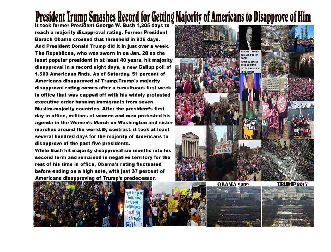

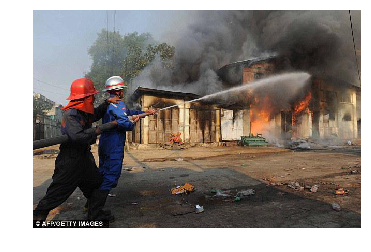

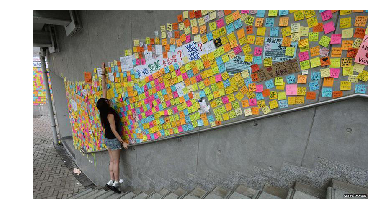

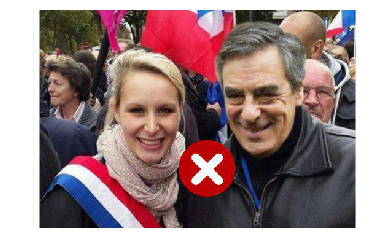

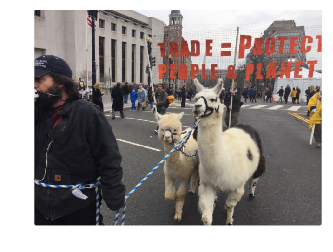

...

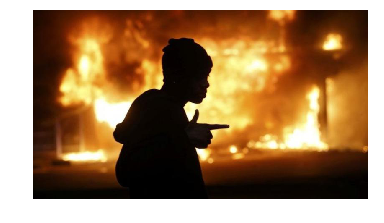

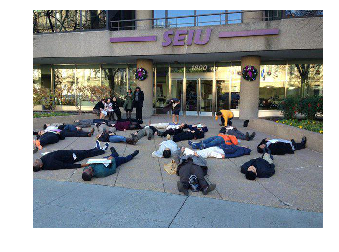

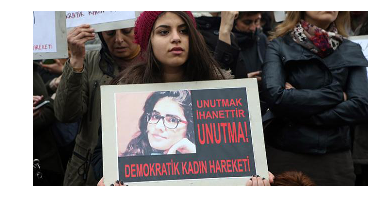

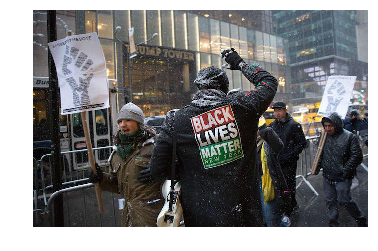

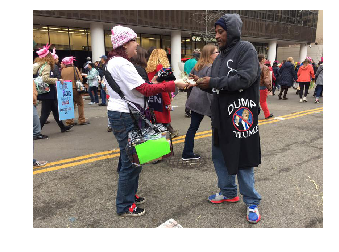

In [24]:
# visualize best
img_paths = best_images['name'].tolist()

for img_path in img_paths:
    path = os.path.join(images_dir, img_path)
    img = Image.open(path)
    plt.imshow(img)
    plt.axis('off')
    plt.show()

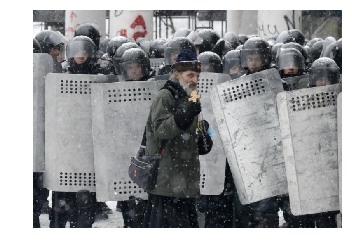

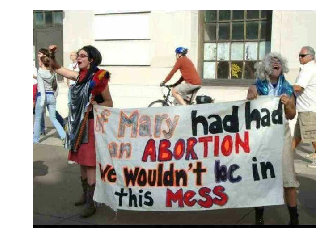

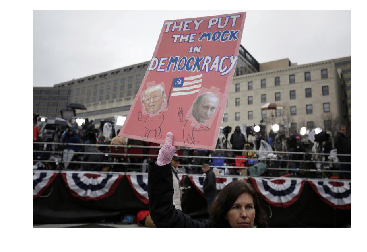

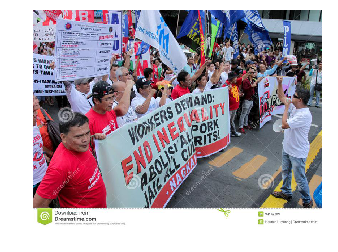

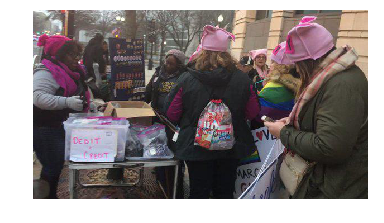

...

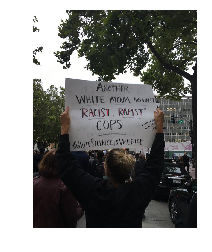

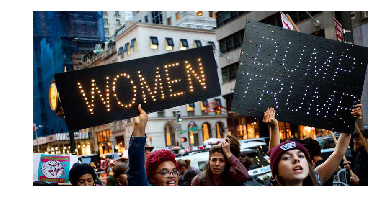

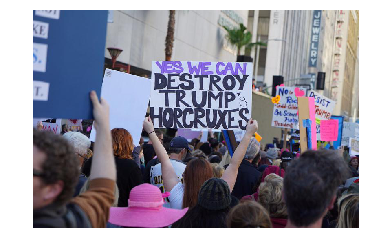

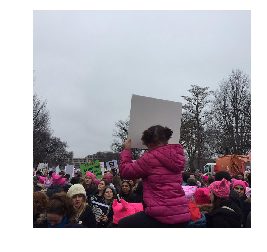

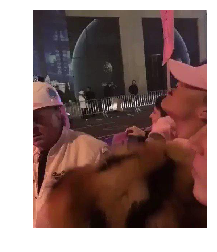

In [25]:
# visualize worst

img_paths = worst_images['name'].tolist()

for img_path in img_paths:
    path = os.path.join(images_dir, img_path)
    img = Image.open(path)
    plt.imshow(img)
    plt.axis('off')
    plt.show()